# Automating stem cell count

In [1]:
# --------- Mounting Drive and Installing Packages ---------

# Are we using Colab?
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

# If so, connect to Google account and install needed packages
if IN_COLAB:
    # We mount the drive
    from google.colab import drive
    drive.mount('/content/drive')
    ! ls drive/MyDrive/datasets/

    # We install the packages
    ! pip install czifile
    ! python -m pip install "napari[all]"
    ! python -m pip install -U scikit-image
    ! pip install pyclesperanto-prototype
    ! pip install lxml
    ! pip install stardist


In [90]:
# --------- Imports ---------

# General Imports
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch, Circle
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D

# Opening Images Imports
import czifile
from pathlib import Path
from lxml import etree


# Visualizing Images Imports
import napari
from napari.utils import nbscreenshot


# Filtering Images Imports
import skimage
import skimage.draw
from skimage import morphology
from skimage import img_as_float
from skimage import exposure
from skimage import filters
from skimage.morphology import reconstruction, disk, white_tophat, square, opening
from skimage.restoration import rolling_ball, denoise_bilateral
from skimage.filters import threshold_otsu
from skimage.measure import regionprops, regionprops_table

from scipy.ndimage import gaussian_filter
from pyclesperanto_prototype import imshow


# Image Segmentation Imports
from stardist.models import StarDist2D
from skimage.segmentation import find_boundaries

# Teselation Imports
from scipy.spatial import Voronoi, voronoi_plot_2d, distance

# Clustering Imports
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

# Bounds for coloring the regions
from shapely.geometry import Polygon, box, GeometryCollection
from shapely.validation import explain_validity, make_valid
from shapely.geometry import Polygon, Point, MultiPolygon




In [3]:
if not IN_COLAB:
  %gui qt

In [4]:
# --------- Opening Images ---------

# Instantiate a Path object
if IN_COLAB:
  czi_file_path = Path(r"drive/MyDrive/datasets/ESTA - Sph1 Z Stack - CTRL SOX2.czi")
else:
  czi_file_path = Path(r"./data/Sph1 Z Stack - CTRL SOX2.czi")

# Read the image and get the CziFile object
with czifile.CziFile(czi_file_path) as czi:
    img = czi.asarray()  # Store image data in 'img' variable
    czi_object = czi  # Store the CziFile object



In [5]:
# I want the name of the czifile as a string
czi_file_name = os.path.basename(czi_file_path)
print(czi_file_name)

Sph1 Z Stack - CTRL SOX2.czi


In [6]:
czi.shape

(1, 1, 3, 1, 9, 2292, 2292, 1)

In [7]:
czi.axes

'BVCTZYX0'

So, according to this, `img` is an array of:
- B = 1, so one block
- V = 1, so one view
- C = 3, so three channels (which makes sense, they are the optic channel, the one indicating the nuclei and the SOX2 channel)
- T = 1, so a single time frame (i.e. no $t$ component)
- Z = 9, so 9 $z$ slices
- Y = 2292, so we have that many pixels in the $y$ direction (height)
- X = 2292, idem (note that we have a square image)
- '0' = 1, indicating that we have a single sample 


I also checked the metadata, and the spacing is the same than with Sph1.
```python
<Scaling>
      <Items>
        <Distance Id="X">
          <Value>1.2364633517553391e-007</Value>
        </Distance>
        <Distance Id="Y">
          <Value>1.2364633517553394e-007</Value>
        </Distance>
        <Distance Id="Z">
          <Value>1.9999999999999999e-006</Value>
        </Distance>
      </Items>
    </Scaling>
```

In [8]:
# --------- Getting rid of the extra dimensions ---------
image_squeezed = np.squeeze(img)
image_squeezed.shape

(3, 9, 2292, 2292)

In [9]:
# --------- Separating the channels ---------

# The first channel is the corresponding to stemness
stemness_channel = image_squeezed[0, :, :, :]
# Channel 2 is the optic one
optic_channel = image_squeezed[1, :, :, :]
# Channel 3 contains the nuclei
nuclei_channel = image_squeezed[2, :, :, :]

In [9]:
#@title Using Napari for Visualization

if not IN_COLAB:
  viewer = napari.Viewer()
  viewer.add_image(nuclei_channel, colormap='blue', blending='additive')
  viewer.add_image(stemness_channel, colormap='red', blending='additive')
  viewer.add_image(optic_channel, colormap='gray', blending='additive')
  print(viewer.layers)
  # We never close the napari window and can take a screenshot whenever we like
  nbscreenshot(viewer)

[<Image layer 'nuclei_channel' at 0x704363fff700>, <Image layer 'stemness_channel' at 0x704363fff8b0>, <Image layer 'optic_channel' at 0x7043605b00d0>]


In [10]:
# Z slice to analyze

z_slice = 3

## Stemness Channel

In [11]:
# --------- Processing the stemness channel ---------

stemness_array = np.copy(stemness_channel)

# Convert to float
stemness_floats_array = img_as_float(stemness_array)

h = 0.5

seed = stemness_floats_array - h
mask = stemness_floats_array

dilated = reconstruction(seed, mask, method='dilation')
hdome = stemness_floats_array - dilated

# Adaptive Equalization
hdome_adapteq = exposure.equalize_adapthist(hdome, clip_limit=0.03)

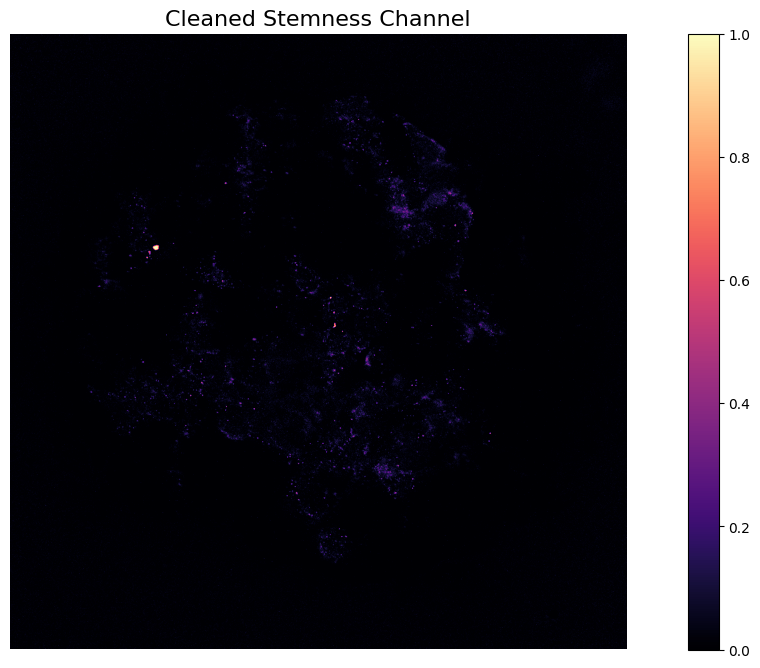

In [12]:
# --------- Visualize the result ---------

fig, ax = plt.subplots(figsize=(16, 8))
ax.imshow(hdome_adapteq[z_slice], cmap='magma')
fig.colorbar(plt.cm.ScalarMappable(norm=None, cmap='magma'), ax=ax)
ax.axis('off')

ax.set_title('Cleaned Stemness Channel', fontsize=16)

# # Saving (Local)
# filename = "/slice_4/sox2_processed.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/sox2_processed.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)




plt.show()  # Display the plot

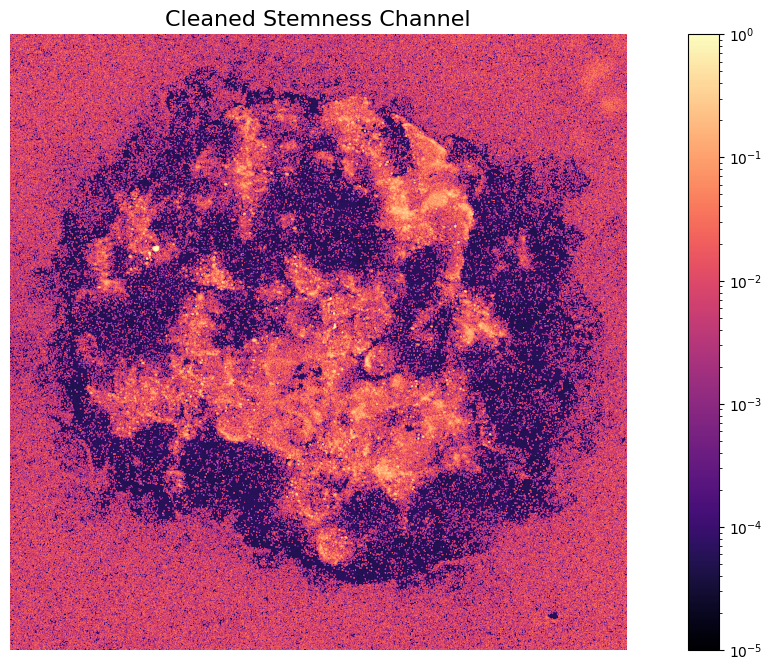

In [13]:
# --------- Visualize the result ---------

fig, ax = plt.subplots(figsize=(16, 8))

norm = LogNorm(vmin=stemness_floats_array[z_slice].min() + 1e-5, vmax=stemness_floats_array[z_slice].max())
cmap = 'magma'

ax.imshow(hdome_adapteq[z_slice], cmap=cmap, norm=norm)
fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
ax.axis('off')

ax.set_title('Cleaned Stemness Channel', fontsize=16)

# # Saving (Local)
# filename = "/slice_4/sox2_processed.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/sox2_processed.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)




plt.show()  # Display the plot

Notar como en la región donde no hay nada, quedó un ruido apreciable, mucho mayor al que quedó luego de la limpieza al rededor de los objetos. Para tratar con esto es que luego uno le corta la cola inferior a la distribución de intensidad de fluorescencia.

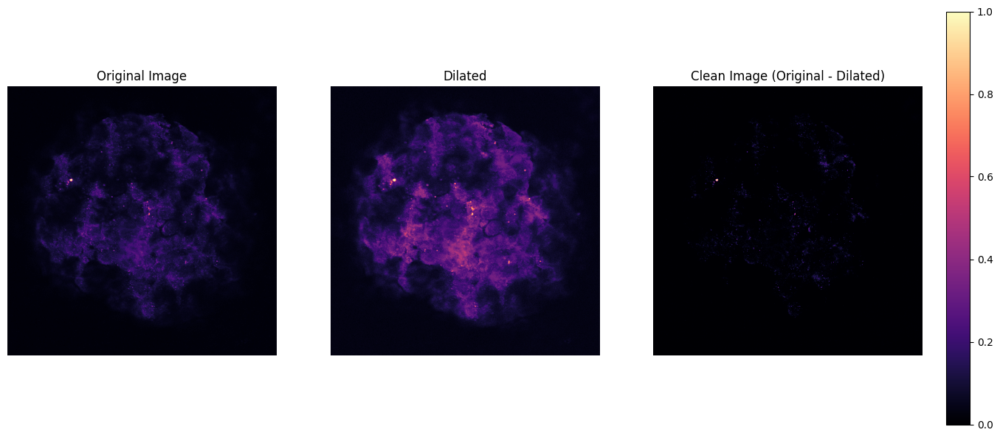

In [14]:
# Your existing code for setting up the figure and axes
fig, (ax0, ax1, ax2) = plt.subplots(nrows=1, ncols=3, figsize=(16, 8))

# First line for linear scale, second line for log scale
norm = None
# norm = LogNorm(vmin=stemness_floats_array[z_slice].min() + 1e-5, vmax=stemness_floats_array[z_slice].max())

# Plot the images with log normalization
# cmap='bwr'
cmap='magma'

ax0.imshow(stemness_floats_array[z_slice], cmap=cmap, norm=norm)
ax0.set_title('Original Image')
ax0.axis('off')

ax1.imshow(dilated[z_slice], cmap=cmap, norm=norm) # , vmin=stemness_floats_array[z_slice].min(), vmax=stemness_floats_array[z_slice].max()
ax1.set_title('Dilated')
ax1.axis('off')

ax2.imshow(hdome[z_slice], cmap=cmap, norm=norm)
ax2.set_title('Clean Image (Original - Dilated)')
ax2.axis('off')

# Add colorbar with log normalization
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # left, bottom, width, height
fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax, orientation='vertical')

# fig.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust the rect parameter to make space for the colorbar

plt.show()

## Nuclei Channel

In [15]:
# 0. Converting the original image to float (originally it's a 'uint16')
image_3d = np.copy(nuclei_channel)
image_2d = image_3d[z_slice]

image_normalized = image_3d.astype(np.float32) / 65535.0

# 1. Adaptive Histogram Equalization on the 3D image
image_3d_equalized = exposure.equalize_adapthist(image_3d)

# 2. Extract a 2D slice from the equalized 3D image
image_2d_equalized = image_3d_equalized[z_slice]

# 3. Morphological opening to remove small noise
selem = morphology.disk(2)  # using a disk-shaped structuring element of radius 2
image_2d_opened = morphology.opening(image_2d_equalized, selem)
image_2d_opened = morphology.area_closing(image_2d_opened, area_threshold=150)

# 4. Bilateral Filtering (denoising without bluring edges)
image_opened_bilateral = denoise_bilateral(image_2d_opened, sigma_color=0.05, sigma_spatial=15)

# 5. Load pretrained StarDist 2D model for fluorescent images
model = StarDist2D.from_pretrained('2D_versatile_fluo')

# Perform instance segmentation on the normalized binary image
labels, details = model.predict_instances(image_opened_bilateral)

# Extract boundaries from the labels
boundaries = find_boundaries(labels)

# ----------------------------------

# Overlay boundaries on the opened, filtered image
overlay = np.copy(image_opened_bilateral)
overlay[boundaries] = np.max(image_opened_bilateral)  # setting the boundary pixels to the maximum value of the image for visualization



Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


2023-12-22 14:05:16.573885: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.
2023-12-22 14:05:16.946057: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.
2023-12-22 14:05:21.503034: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 339738624 exceeds 10% of free system memory.
2023-12-22 14:05:22.365711: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.


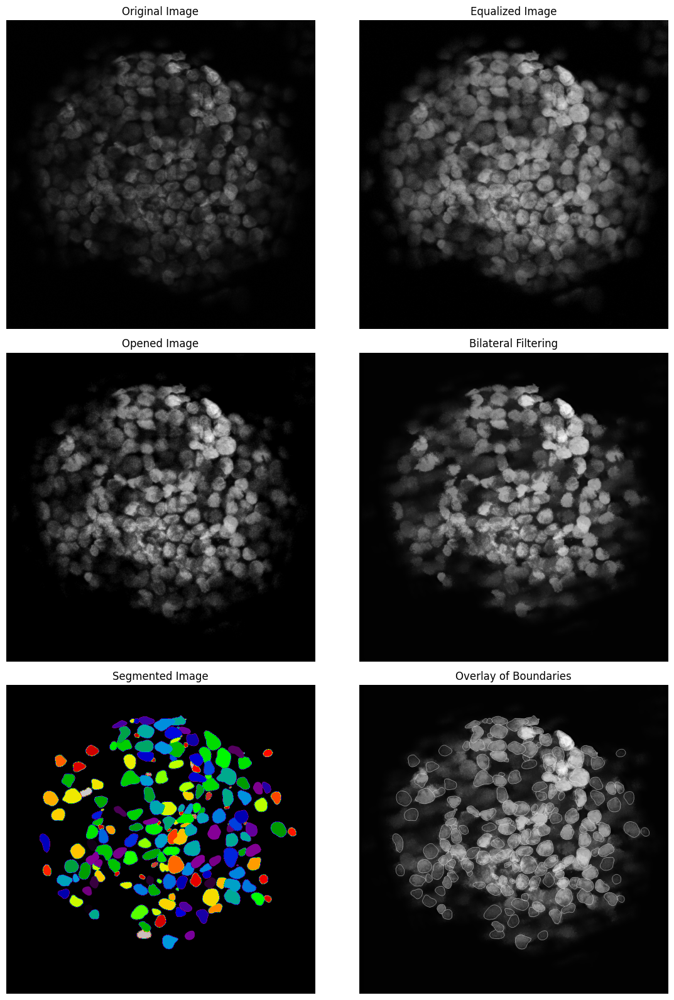

In [16]:
# --------- Visualize the result ---------


# Plotting the original, equalized, opened, and segmented images
fig, axes = plt.subplots(3, 2, figsize=(12, 16))
ax = axes.ravel()

ax[0].imshow(image_2d, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(image_2d_equalized, cmap='gray')
ax[1].set_title("Equalized Image")
ax[1].axis('off')

ax[2].imshow(image_2d_opened, cmap='gray')
ax[2].set_title("Opened Image")
ax[2].axis('off')

ax[3].imshow(image_opened_bilateral, cmap='gray')
ax[3].set_title("Bilateral Filtering")
ax[3].axis('off')

ax[4].imshow(labels, cmap='nipy_spectral')
ax[4].set_title("Segmented Image")
ax[4].axis('off')

ax[5].imshow(overlay, cmap='gray')
ax[5].set_title("Overlay of Boundaries")
ax[5].axis('off')

plt.tight_layout()


# # Saving (Local)
# filename = "/slice_4/nuclei_processing.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/sox2_processed.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)



plt.show()

## Generating the DataFrame

In [17]:
# --------- Generation of the DataFrame with geometrical properties of segmented objects ---------

spacing = (1.2364633517553391e-7, 1.2364633517553391e-7)  # in meters for (y, x) dimensions

properties = [
    "label", "area", "centroid", "equivalent_diameter", "bbox_area", "convex_area", "filled_area", "major_axis_length",
    "minor_axis_length", "bbox", "weighted_centroid", "coords",
    "eccentricity", "euler_number", "extent",
    "feret_diameter_max", "max_intensity", "mean_intensity", "min_intensity",
    "orientation", "perimeter", "solidity"
]

# Extract the region properties
regions = regionprops_table(labels, intensity_image=image_opened_bilateral, properties=properties) # , spacing=spacing

# Convert the result to a DataFrame
df = pd.DataFrame(regions)
df


,label,area,centroid-0,centroid-1,equivalent_diameter,bbox_area,convex_area,filled_area,major_axis_length,minor_axis_length,...,eccentricity,euler_number,extent,feret_diameter_max,max_intensity,mean_intensity,min_intensity,orientation,perimeter,solidity
0,1,3204.0,1662.641074,607.815855,63.870647,4347.0,3259.0,3204.0,68.786238,59.820723,...,0.493649,1,0.737060,71.470274,0.325997,0.264932,0.016023,-0.344251,211.965512,0.983124
1,2,5083.0,1189.104072,636.635058,80.447975,7020.0,5173.0,5083.0,95.232220,68.448353,...,0.695266,1,0.724074,97.948966,0.504318,0.378100,0.085399,0.544918,274.592929,0.982602
2,3,3300.0,1452.323939,1065.436364,64.820448,4453.0,3371.0,3300.0,70.715113,59.675364,...,0.536525,1,0.741073,75.186435,0.589241,0.460765,0.189586,0.186678,217.137085,0.978938
3,4,5203.0,1471.086296,1512.976936,81.392047,7216.0,5275.0,5203.0,91.614034,72.756361,...,0.607706,1,0.721037,93.407708,0.630762,0.494673,0.143238,-0.972377,271.563492,0.986351
4,5,4578.0,1466.881171,652.288554,76.347172,6231.0,4672.0,4578.0,91.330323,64.443021,...,0.708607,1,0.734714,93.770998,0.349929,0.270635,0.067041,0.080902,261.521861,0.979880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184,185,805.0,976.858385,1397.991304,32.014963,1258.0,870.0,805.0,40.926492,26.079088,...,0.770684,1,0.639905,42.201896,0.570675,0.373405,0.072562,0.609956,114.811183,0.925287
185,186,936.0,667.054487,1055.739316,34.521764,1215.0,969.0,936.0,46.539594,25.716896,...,0.833459,1,0.770370,45.891176,0.353829,0.178807,0.097310,1.407554,120.083261,0.965944
186,187,932.0,598.084764,1377.718884,34.447921,2016.0,1122.0,932.0,49.617094,28.355663,...,0.820609,1,0.462302,57.271284,0.455039,0.310005,0.103684,0.253947,148.539105,0.830660
187,188,5171.0,1854.631986,1020.615935,81.141369,7303.0,5683.0,5171.0,111.049149,60.884924,...,0.836301,1,0.708065,109.553640,0.227770,0.135792,0.051253,1.541272,303.663997,0.909907


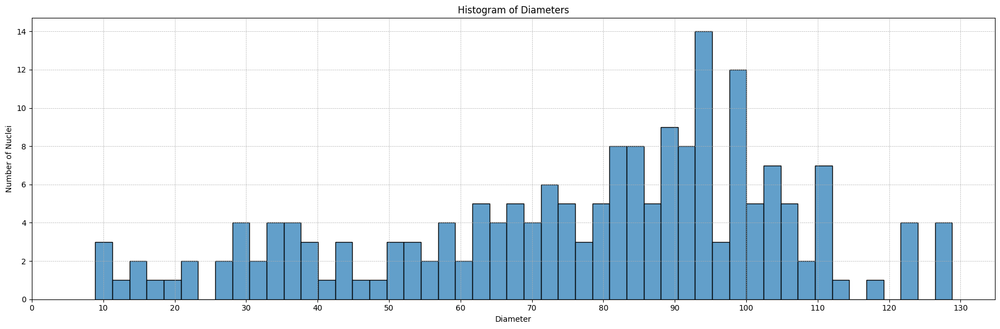

In [19]:
plt.figure(figsize=(18, 6))
sns.histplot(df, x='equivalent_diameter', bins=50, element='bars', stat='count', alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Diameters')
plt.xlabel('Diameter')
plt.ylabel('Number of Nuclei')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()


Podría cortar tomando sólo los objetos con diámetro > 24.

In [20]:
# --------- Voronoi Teselation ---------

# Convert centroids to integer coordinates for seeding
centroids = df[['centroid-0', 'centroid-1']].to_numpy().astype(int)

# Using the centroids as the points for Voronoi, but making sure we're using (x, y) coordinates
points = np.array([(c, r) for r, c in centroids])  # Note the coordinate reversal here
vor = Voronoi(points)


In [21]:
# --------- Counting Fluorescence Intensity in each region ---------

sox2_img = hdome[z_slice]
# sox2_img = average_hdome_adapteq

# Create a blank image for Voronoi segmentation
voronoi_regions = np.zeros_like(sox2_img, dtype=int)

# Generate Voronoi regions
points = np.array([(c, r) for r, c in centroids])
vor = Voronoi(points)

intensity_sums = [0] * len(centroids)  # Initialize intensity sums with zeros

for region in vor.regions:
    if not -1 in region and len(region) > 0:  # Check if the region is not infinite and not empty
        polygon = [vor.vertices[i] for i in region]
        if len(polygon) > 2:  # Ensure that we have a valid polygon with more than 2 vertices
            rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], voronoi_regions.shape)

            # Determine which centroid this region belongs to based on proximity
            region_centroid = (np.mean(rr), np.mean(cc))
            idx = np.argmin([distance.euclidean(region_centroid, cent) for cent in centroids])

            voronoi_regions[rr, cc] = idx + 1  # Add 1 to avoid using zero as a label
            intensity_sums[idx] += np.sum(sox2_img[rr, cc])  # Update the intensity sum for this region

# Add the intensity sums to the dataframe
df['Fluorescence_Intensity'] = intensity_sums

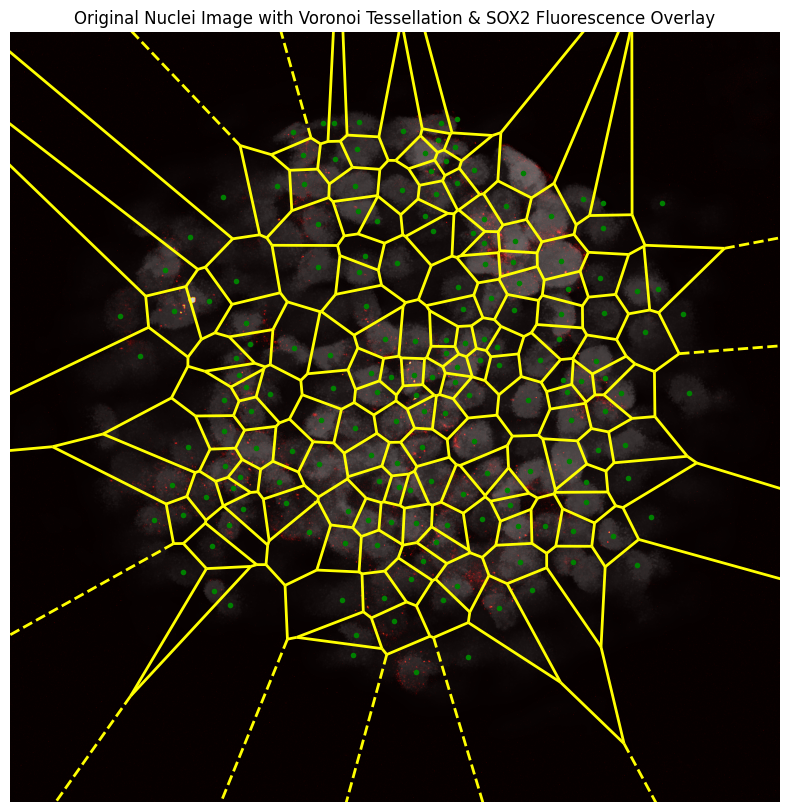

In [22]:
# ========== NEW VORONOI EXCLUDING CELLS OUTSIDE THE SPHEROID ==========


# 1. Calculate center_of_spheroid
center_of_spheroid = df[['centroid-0', 'centroid-1']].mean().values

# 2. Calculate total_spheroid_diameter
df['distance_to_center'] = np.sqrt((df['centroid-0'] - center_of_spheroid[0])**2 + 
                                   (df['centroid-1'] - center_of_spheroid[1])**2)
total_spheroid_diameter = df['distance_to_center'].max()

# 3. Define alpha and add the 'in_spheroid' column
alpha = 0.95
df['in_spheroid'] = df['distance_to_center'] <= alpha * total_spheroid_diameter


# 4. Modify the Voronoi plot
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Filter centroids for in_spheroid == True
filtered_centroids = df[df['in_spheroid']][['centroid-0', 'centroid-1']].values
vor = Voronoi(np.array([(c, r) for r, c in filtered_centroids]))

# Overlay the Voronoi diagram
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Overlay the fluorescence channel
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)

# Display the centroids within the spheroid
for (r, c) in filtered_centroids:
    ax.plot(c, r, 'g.')

ax.set_xlim([0, labels.shape[1]])
ax.set_ylim([labels.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()


In [23]:
df['in_spheroid'].value_counts()

in_spheroid
True     183
False      6
Name: count, dtype: int64

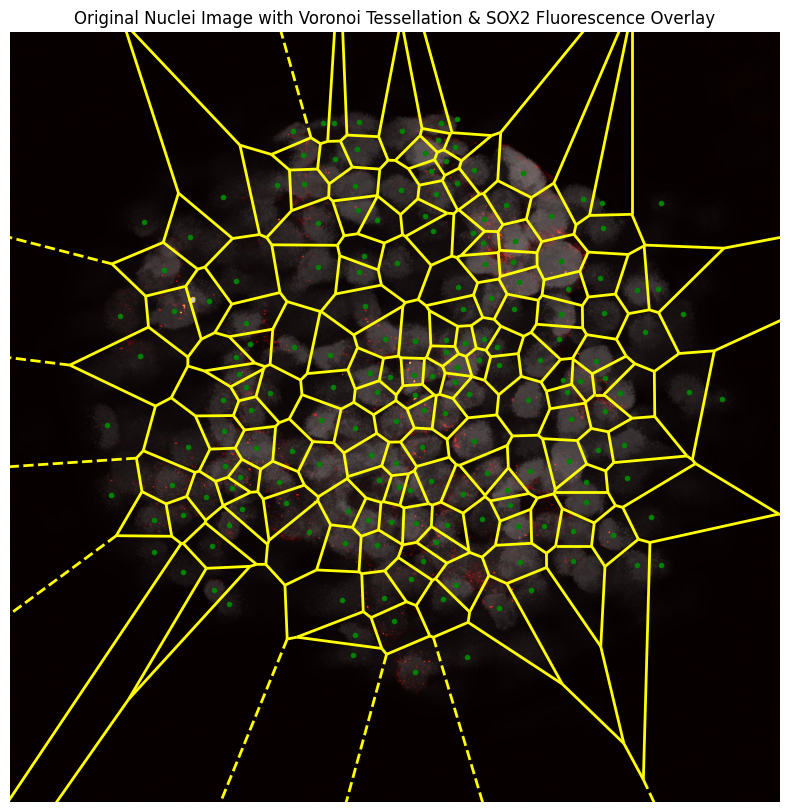

In [24]:
# --------- Regions, Nuclei and SOX2 Overlay ---------

# Using the centroids as the points for Voronoi, ensuring (x, y) coordinates
points = np.array([(c, r) for r, c in centroids])  # Coordinate reversal
vor = Voronoi(points)

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Overlay the Voronoi diagram without the original Voronoi points
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Overlay the fluorescence channel using a colormap. Here, I assume fluorescence_image represents your fluorescence channel.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids on top
for (r, c) in centroids:
    ax.plot(c, r, 'g.')  # Using (x, y) convention

ax.set_xlim([0, labels.shape[1]])
ax.set_ylim([labels.shape[0], 0])  # Invert y-axis to match image coordinates
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')


# # Saving (Local)
# filename = "Devel/experimental_images/results/slice_4/nuclei_voronoi_sox2.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/nuclei_voronoi_sox2.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)



plt.show()

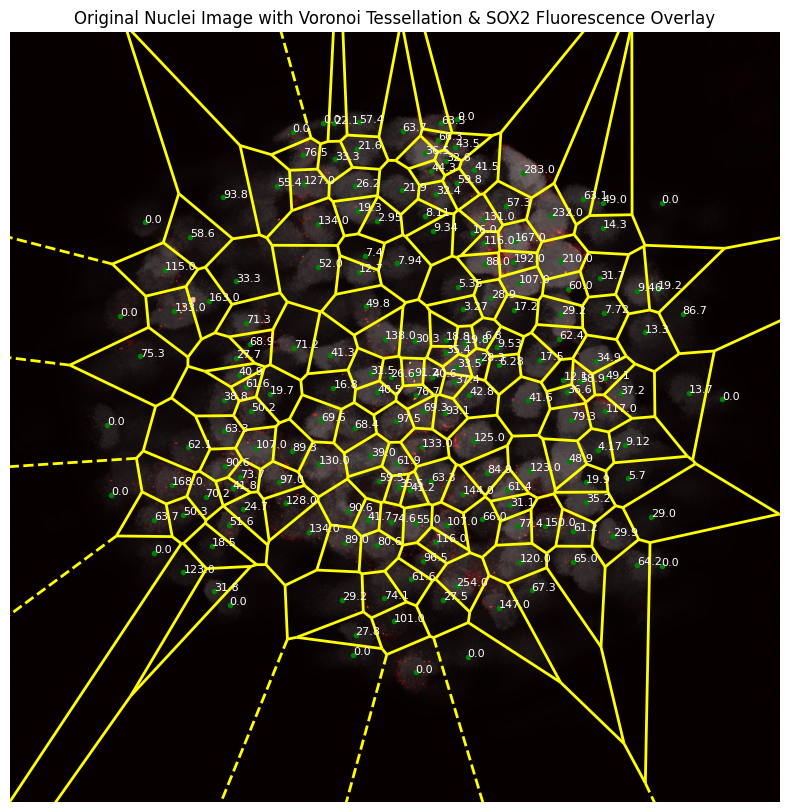

In [140]:
# =========== ANOTATION OF THE VORONOI REGIONS WITH THE FLUORESCENCE INTENSITY ===========

# Define your centroids and calculate the Voronoi diagram
centroids = df[['centroid-1', 'centroid-0']].values  # Reverse coordinates for plotting
vor = Voronoi(centroids)

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')  # Display the image

# Overlay the Voronoi diagram
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Overlay the fluorescence channel
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for transparency

# Annotate each centroid with its Fluorescence_Intensity, using only the first two significant digits
for idx, (r, c) in enumerate(centroids):
    intensity = df.at[idx, 'Fluorescence_Intensity']
    intensity = float(f'{intensity:.3g}')  # Keep only two significant digits
    ax.plot(r, c, 'g.')  # Mark the centroid
    ax.text(r, c, str(intensity), color='white', fontsize=8)  # Annotate with intensity

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])  # Invert y-axis to match image coordinates
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')
plt.show()


Claramente hay regiones (cuya área no está acotada) que tienen SOX2, y sin embargo tienen `Fluorescence_Intensity` nula. Esto es un problema que probablemente esté arrastrando de usar `skimage.draw.polygon` en las regiones no acotadas.

## Stem and Differentiated Cell Clustering

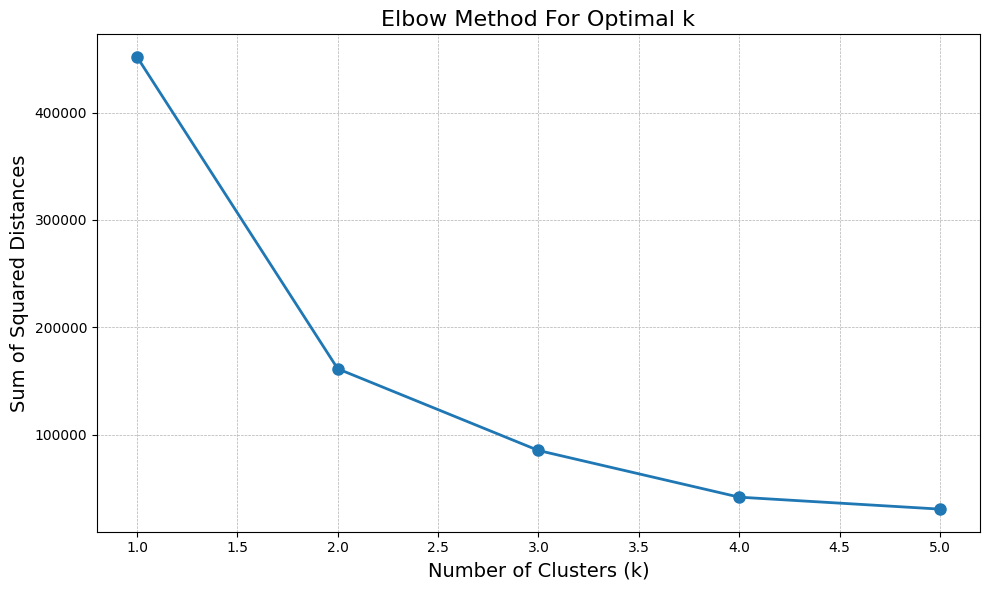

In [25]:
# --------- Elbow plot for cluster number ---------

# Extract fluorescence intensity values from the DataFrame
fluorescence_intensities = df['Fluorescence_Intensity'].loc[df["in_spheroid"]==True].values.reshape(-1, 1)

# Calculate sum of squared distances (SSD) for different values of k
ssd = []
range_n_clusters = range(1, 6)

for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init='auto', random_state=42)
    kmeans.fit(fluorescence_intensities)
    ssd.append(kmeans.inertia_)

# Plot the SSD values against k to visualize the elbow
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, ssd, 'o-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters (k)', fontsize=14)
plt.ylabel('Sum of Squared Distances', fontsize=14)
plt.title('Elbow Method For Optimal k', fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

In [26]:
# ======== Original Way ========

# Filter out regions with Fluorescence_Intensity <= 180
filtered_df = df[df['Fluorescence_Intensity'] <= 180].copy()  # Use copy() to ensure we're working on a copy

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Perform GMM clustering with k=2
gmm = GaussianMixture(n_components=2)
gmm.fit(X)


# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'filtered_GMM_stemness'] = labels


# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'filtered_GMM_stemness'] = labels

# Create a new column in the original dataframe for the mapped labels, initialized to NaN
df['filtered_GMM_stemness'] = np.nan

# Map the GMM_stemness labels back to the original df
df.update(filtered_df['filtered_GMM_stemness'])

# Set the values to 1 where Fluorescence_Intensity > 180
df.loc[df['Fluorescence_Intensity'] > 180, 'filtered_GMM_stemness'] = 1


In [27]:
# ========== NEW CLUSTERING EXCLUDING CELLS OUTSIDE THE SPHEROID (still with <180 fliter) ==========

# Filter out regions with Fluorescence_Intensity <= 180 and in_spheroid = True
filtered_df = df[(df['Fluorescence_Intensity'] <= 180) & (df['in_spheroid'])].copy()

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Perform GMM clustering with k=2
gmm = GaussianMixture(n_components=2)
gmm.fit(X)

# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'filtered_in_spheroid_GMM_stemness'] = labels

# Create a new column in the original dataframe for the mapped labels, initialized to NaN
df['filtered_in_spheroid_GMM_stemness'] = np.nan

# Map the GMM_stemness labels back to the original df
df.update(filtered_df[['filtered_in_spheroid_GMM_stemness']])

# Set the values to 1 where Fluorescence_Intensity > 180 and in_spheroid = True
df.loc[(df['Fluorescence_Intensity'] > 180) & (df['in_spheroid']), 'filtered_in_spheroid_GMM_stemness'] = 1


In [28]:
# ========== CUTTING DISTRIBUTION TAILS ==========

# Calculate the 5th and 95th percentile values of Fluorescence_Intensity
lower_threshold = df['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df['Fluorescence_Intensity'].quantile(0.95)

# Initialize the 'tails_cut_GMM_stemness' column with NaN
df['tails_cut_GMM_stemness'] = np.nan

# Assign 0 to the 5% lowest intensity regions (non-stem)
df.loc[df['Fluorescence_Intensity'] <= lower_threshold, 'tails_cut_GMM_stemness'] = 0

# Assign 1 to the 95% highest intensity regions (stem)
df.loc[df['Fluorescence_Intensity'] >= upper_threshold, 'tails_cut_GMM_stemness'] = 1

# Filter the dataframe for the regions to be included in GMM clustering
filtered_df = df[(df['Fluorescence_Intensity'] > lower_threshold) & (df['Fluorescence_Intensity'] < upper_threshold)].copy()

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Perform GMM clustering with k=2
gmm = GaussianMixture(n_components=2)
gmm.fit(X)

# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'tails_cut_GMM_stemness'] = labels

# Update the original dataframe with the GMM clustering results
df.update(filtered_df['tails_cut_GMM_stemness'])


# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'tails_cut_in_spheroid_GMM_stemness'] = labels

# Create a new column in the original dataframe for the mapped labels, initialized to NaN
df['tails_cut_in_spheroid_GMM_stemness'] = np.nan

# Map the GMM_stemness labels back to the original df
df.update(filtered_df[['tails_cut_in_spheroid_GMM_stemness']])

# The 'tails_cut_GMM_stemness' column in 'df' now contains:
# 0 for non-stem regions, 1 for stem regions, and NaN for excluded high/low-intensity regions


In [29]:
df['tails_cut_GMM_stemness'].value_counts()

tails_cut_GMM_stemness
0.0    103
1.0     86
Name: count, dtype: int64

In [30]:
df['tails_cut_GMM_stemness'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 189 entries, 0 to 188
Series name: tails_cut_GMM_stemness
Non-Null Count  Dtype  
--------------  -----  
189 non-null    float64
dtypes: float64(1)
memory usage: 1.6 KB


In [31]:
# ========== EXCLUDING CELLS OUTSIDE THE SPHEROID AND CUTTING DISTRIBUTION TAILS ==========


# Calculate the 5th and 95th percentile values of Fluorescence_Intensity within the spheroid
lower_threshold = df[df['in_spheroid']]['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df[df['in_spheroid']]['Fluorescence_Intensity'].quantile(0.95)

# Initialize the 'tails_cut_in_spheroid_GMM_stemness' column with NaN (into which we'll map the GMM labels)
df['tails_cut_in_spheroid_GMM_stemness'] = np.nan

# Assign 0 to the 5% lowest intensity regions within the spheroid (non-stem)
df.loc[(df['Fluorescence_Intensity'] <= lower_threshold) & (df['in_spheroid']), 'tails_cut_in_spheroid_GMM_stemness'] = 0

# Assign 1 to the 95% highest intensity regions within the spheroid (stem)
df.loc[(df['Fluorescence_Intensity'] >= upper_threshold) & (df['in_spheroid']), 'tails_cut_in_spheroid_GMM_stemness'] = 1

# Filter the dataframe for the regions to be included in GMM clustering (inside the spheroid and not in the tails)
filtered_df = df[(df['Fluorescence_Intensity'] > lower_threshold) & 
                 (df['Fluorescence_Intensity'] < upper_threshold) & 
                 (df['in_spheroid'])].copy()

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Perform GMM clustering with k=2
gmm = GaussianMixture(n_components=2)
gmm.fit(X)

# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'tails_cut_in_spheroid_GMM_stemness'] = labels


# Map the GMM_stemness labels back to the original df
df.update(filtered_df[['tails_cut_in_spheroid_GMM_stemness']])

# Note: Regions outside the spheroid or in the tails are already handled with NaN or the set values (0 and 1)


In [32]:
df[['label', 'Fluorescence_Intensity', 'filtered_GMM_stemness', 'filtered_in_spheroid_GMM_stemness', 'tails_cut_GMM_stemness', 'tails_cut_in_spheroid_GMM_stemness']].loc[df['Fluorescence_Intensity']>85].loc[df['Fluorescence_Intensity']<95].sort_values(by='Fluorescence_Intensity')

,label,Fluorescence_Intensity,filtered_GMM_stemness,filtered_in_spheroid_GMM_stemness,tails_cut_GMM_stemness,tails_cut_in_spheroid_GMM_stemness
155,156,86.736324,1.0,1.0,1.0,1.0
35,36,88.024681,1.0,1.0,1.0,1.0
48,49,88.998238,1.0,1.0,1.0,1.0
10,11,89.272694,1.0,1.0,1.0,1.0
173,174,90.623392,1.0,1.0,1.0,1.0
16,17,90.631662,1.0,1.0,1.0,1.0
76,77,91.185878,1.0,1.0,1.0,1.0
143,144,93.108789,1.0,1.0,1.0,1.0
177,178,93.787961,1.0,1.0,1.0,1.0


In [33]:
# ========== CALCULATING SUMMARY STATISTICS ==========

# ====== General Information ======
czi_file_name = os.path.basename(czi_file_path)
total_cells = df.shape[0]
cells_in_spheroid = df.loc[df['in_spheroid']==True].shape[0]
cells_outside_spheroid = df.loc[df['in_spheroid']==False].shape[0]


# ====== For 'filtered_GMM_stemness' ======
filtered_GMM_stemness_ones = df['filtered_GMM_stemness'].sum()
percentage_filtered_GMM_stemness_ones = filtered_GMM_stemness_ones / df.shape[0] * 100


# ====== For 'filtered_in_spheroid_GMM_stemness' ======
filtered_in_spheroid_GMM_stemness_ones = df['filtered_in_spheroid_GMM_stemness'].sum()
percentage_in_sph_filtered_in_spheroid_GMM_stemness_ones = filtered_in_spheroid_GMM_stemness_ones / df.loc[df['in_spheroid']==True].shape[0] * 100
percentage_total_filtered_in_spheroid_GMM_stemness_ones = filtered_in_spheroid_GMM_stemness_ones / df.shape[0] * 100


# ====== For 'tails_cut_GMM_stemness' ======
tails_cut_GMM_stemness_ones = df['tails_cut_GMM_stemness'].sum()
percentage_tails_cut_GMM_stemness_ones = tails_cut_GMM_stemness_ones / df.shape[0] * 100


# ====== For 'tails_cut_in_spheroid_GMM_stemness' ======
tails_cut_in_spheroid_GMM_stemness_ones = df['tails_cut_in_spheroid_GMM_stemness'].sum()
percentage_in_sph_tails_cut_in_spheroid_GMM_stemness_ones = tails_cut_in_spheroid_GMM_stemness_ones / df.loc[df['in_spheroid']==True].shape[0] * 100
percentage_total_tails_cut_in_spheroid_GMM_stemness_ones = tails_cut_in_spheroid_GMM_stemness_ones / df.shape[0] * 100


# ====== Calculate thresholds for each feature ======
def calculate_thresholds(df, feature):
    # Sort the DataFrame by Fluorescence_Intensity
    sorted_df = df.sort_values(by='Fluorescence_Intensity')
    # Identify the max intensity for class 0 and min intensity for class 1
    max_intensity_class_0 = sorted_df[sorted_df[feature] == 0]['Fluorescence_Intensity'].max()
    min_intensity_class_1 = sorted_df[sorted_df[feature] == 1]['Fluorescence_Intensity'].min()
    # Calculate the average to define the threshold
    return (max_intensity_class_0 + min_intensity_class_1) / 2.0

# Calculate thresholds
threshold_filtered_GMM = calculate_thresholds(df, 'filtered_GMM_stemness')
threshold_filtered_in_spheroid = calculate_thresholds(df[df['in_spheroid']==True], 'filtered_in_spheroid_GMM_stemness')
threshold_tails_cut = calculate_thresholds(df, 'tails_cut_GMM_stemness')
threshold_tails_cut_in_spheroid = calculate_thresholds(df[df['in_spheroid']==True], 'tails_cut_in_spheroid_GMM_stemness')


# ========== PRINTING THE SUMMARY STATISTICS ==========
print('-------------------- SUMMARY ------------------------')

# General information
print(f"File name: {czi_file_name}")
print(f'Slice: {z_slice}')
print(f"Total number of cells: {total_cells}")
print(f"Number of cells in the spheroid: {cells_in_spheroid}")
print(f"Number of cells outside the spheroid: {cells_outside_spheroid}")
print('--------------------------------------------')

# For 'filtered_GMM_stemness'
print(f"Number of CSCs according to filtered_GMM_stemness: {filtered_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {total_cells - filtered_GMM_stemness_ones}')
print(f'They represent {percentage_filtered_GMM_stemness_ones:.2f}% of the total number of cells.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_filtered_GMM:.4f}.')
print('--------------------------------------------')

# For 'filtered_in_spheroid_GMM_stemness'
print(f"Number of CSCs according to filtered_in_spheroid_GMM_stemness: {filtered_in_spheroid_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {cells_in_spheroid - filtered_in_spheroid_GMM_stemness_ones}')
print(f'They represent {percentage_total_filtered_in_spheroid_GMM_stemness_ones:.2f}% of the total number of cells,')
print(f'and {percentage_in_sph_filtered_in_spheroid_GMM_stemness_ones:.2f}% of the number of cells in the spheroid.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_filtered_in_spheroid:.4f}.')
print('--------------------------------------------')

# For 'tails_cut_GMM_stemness'
print(f"Number of CSCs according to tails_cut_GMM_stemness: {tails_cut_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {total_cells - tails_cut_GMM_stemness_ones}')
print(f'They represent {percentage_tails_cut_GMM_stemness_ones:.2f}% of the total number of cells.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_tails_cut:.4f}.')
print('--------------------------------------------')

# For 'tails_cut_in_spheroid_GMM_stemness'
print(f"Number of CSCs according to tails_cut_in_spheroid_GMM_stemness: {tails_cut_in_spheroid_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {cells_in_spheroid - tails_cut_in_spheroid_GMM_stemness_ones}')
print(f'They represent {percentage_total_tails_cut_in_spheroid_GMM_stemness_ones:.2f}% of the total number of cells,')
print(f'and {percentage_in_sph_tails_cut_in_spheroid_GMM_stemness_ones:.2f}% of the number of cells in the spheroid.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_tails_cut_in_spheroid:.4f}.')
print('--------------------------------------------')


-------------------- SUMMARY ------------------------
File name: Sph1 Z Stack - CTRL SOX2.czi
Slice: 3
Total number of cells: 189
Number of cells in the spheroid: 183
Number of cells outside the spheroid: 6
--------------------------------------------
Number of CSCs according to filtered_GMM_stemness: 46.0
Corresponding number of DCCs: 143.0
They represent 24.34% of the total number of cells.
The threshold is roughly at a fluorescence intensity of 79.9585.
--------------------------------------------
Number of CSCs according to filtered_in_spheroid_GMM_stemness: 46.0
Corresponding number of DCCs: 137.0
They represent 24.34% of the total number of cells,
and 25.14% of the number of cells in the spheroid.
The threshold is roughly at a fluorescence intensity of 79.9585.
--------------------------------------------
Number of CSCs according to tails_cut_GMM_stemness: 86.0
Corresponding number of DCCs: 103.0
They represent 45.50% of the total number of cells.
The threshold is roughly at a fl

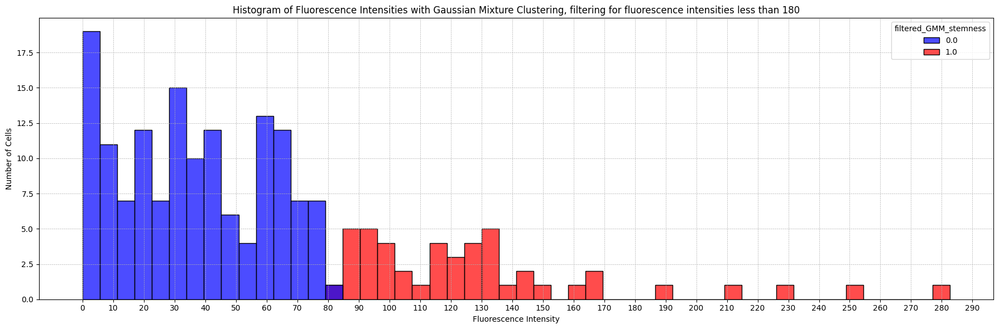

In [34]:
plt.figure(figsize=(18, 6))
sns.histplot(df, x='Fluorescence_Intensity', hue='filtered_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering, filtering for fluorescence intensities less than 180')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()



# # Save the plot to your computer
# filename = "/content/histogram_GMM-means-filtered-intensity<180_clustering.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)

# # To download the file to your local machine from Colab
# from google.colab import files
# files.download(filename)



plt.show()

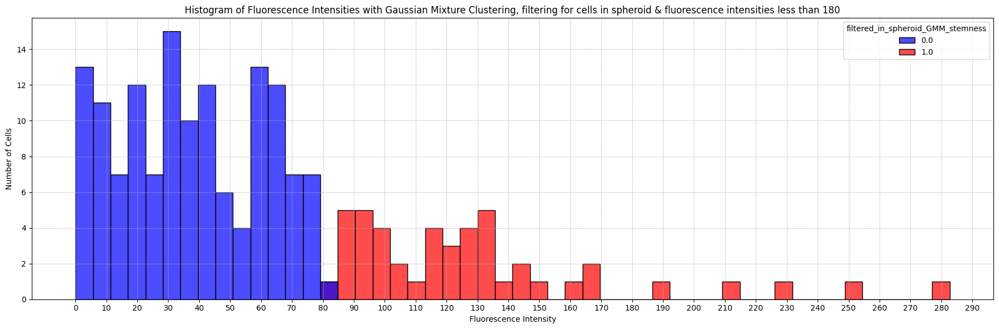

In [35]:
# ========== NEW CLUSTERING EXCLUDING CELLS OUTSIDE THE SPHEROID ==========

plt.figure(figsize=(18, 6))
df_in_spheroid = df.loc[df['in_spheroid']==True].copy()
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='filtered_in_spheroid_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering, filtering for cells in spheroid & fluorescence intensities less than 180')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()



# # Save the plot to your computer
# filename = "/content/histogram_GMM-means-filtered-intensity<180_clustering.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)

# # To download the file to your local machine from Colab
# from google.colab import files
# files.download(filename)



plt.show()

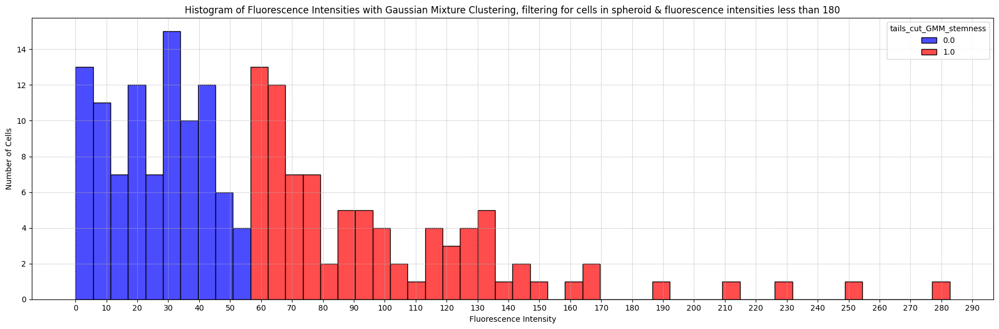

In [36]:
# ========== CUTTING DISTRIBUTION TAILS ==========

plt.figure(figsize=(18, 6))
df_in_spheroid = df.loc[df['in_spheroid']==True].copy()
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='tails_cut_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering, filtering for cells in spheroid & fluorescence intensities less than 180')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()



# # Save the plot to your computer
# filename = "/content/histogram_GMM-means-filtered-intensity<180_clustering.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)

# # To download the file to your local machine from Colab
# from google.colab import files
# files.download(filename)



plt.show()

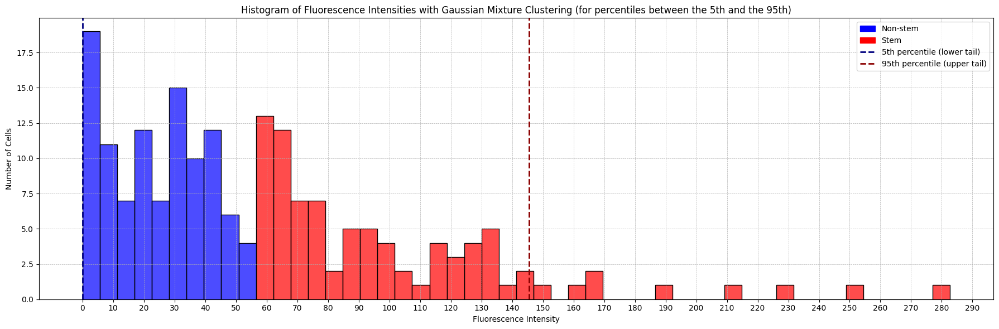

In [37]:
# ========== CUTTING DISTRIBUTION TAILS: TAILS INDICATED ==========

plt.figure(figsize=(18, 6))

# In this case, we do NOT filter for cells in the spheroid, so we use the original df
df_in_spheroid = df

# Main histogram plot for 'tails_cut_GMM_stemness'
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='tails_cut_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Calculate the 5th and 95th percentile values
lower_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.95)

# Plotting vertical lines to indicate the 5th and 95th percentile thresholds
lower_tail_line = plt.axvline(x=lower_threshold, color='navy', linestyle='--', linewidth=2)
upper_tail_line = plt.axvline(x=upper_threshold, color='darkred', linestyle='--', linewidth=2)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering (for percentiles between the 5th and the 95th)')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

# Create custom legend
legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='Non-stem'),
                   Patch(facecolor='red', edgecolor='red', label='Stem'),
                   Line2D([0], [0], color='navy', linestyle='--', linewidth=2, label='5th percentile (lower tail)'),
                   Line2D([0], [0], color='darkred', linestyle='--', linewidth=2, label='95th percentile (upper tail)')]

plt.legend(handles=legend_elements)

plt.show()



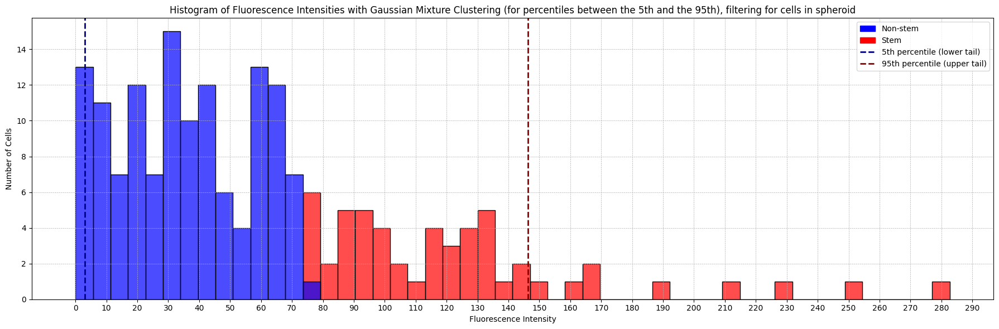

In [38]:
# ========== EXCLUDING CELLS OUTSIDE THE SPHEROID AND CUTTING DISTRIBUTION TAILS ==========


plt.figure(figsize=(18, 6))

# Create a dataframe for cells in the spheroid
df_in_spheroid = df.loc[df['in_spheroid'] == True].copy()

# Main histogram plot for 'tails_cut_GMM_stemness'
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='tails_cut_in_spheroid_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Calculate the 5th and 95th percentile values
lower_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.95)

# Plotting vertical lines to indicate the 5th and 95th percentile thresholds
lower_tail_line = plt.axvline(x=lower_threshold, color='navy', linestyle='--', linewidth=2)
upper_tail_line = plt.axvline(x=upper_threshold, color='darkred', linestyle='--', linewidth=2)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering (for percentiles between the 5th and the 95th), filtering for cells in spheroid')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

# Create custom legend
legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='Non-stem'),
                   Patch(facecolor='red', edgecolor='red', label='Stem'),
                   Line2D([0], [0], color='navy', linestyle='--', linewidth=2, label='5th percentile (lower tail)'),
                   Line2D([0], [0], color='darkred', linestyle='--', linewidth=2, label='95th percentile (upper tail)')]

plt.legend(handles=legend_elements)

plt.show()


Notar como la línea del percentil 5 se mueve a la derecha. Esto tiene que ver con que excluir células fuera del esferoide, es excluir las sueltas y algunas del borde. Las del borde suelen tener mucha limpieza de SOX2 a su alrededor, por lo que pueden ser altas o bajas según la teselación de ese caso particular. Las que están lejos del esferoide (sueltas), pueden tener mucho SOX2 porque la limpieza no las afecta tanto, pero en general involucran áreas que casi no tienen SOX2 en primer lugar. Como resultado, si bien pueden haber excepciones por los motivos mencionados, excluir células fuera del esferoide puede ya estarme excluyendo fluorescencias bajas (lo que mueve la línea del percentil 5 a la derecha).

In [101]:
# Save the DataFrame to a CSV

# Define the directory path
directory = f"./results/sph1_reprocessed/slice_{z_slice}/"
csv_file_path = os.path.join(directory, f"sph1_slice_{z_slice}.csv")

# # Save the DataFrame to a CSV in the specified directory
# df.to_csv(csv_file_path, index=False)


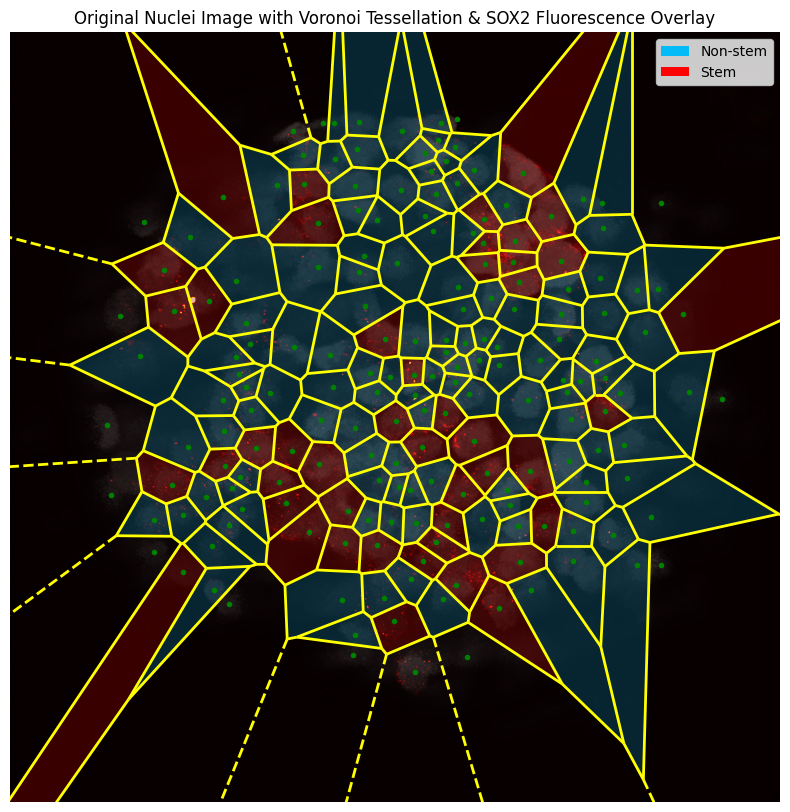

In [39]:
# ========== ORIGINAL VERSION ==========

# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # modified colors as requested

# Using the centroids as the points for Voronoi, ensuring (x, y) coordinates
points = np.array([(c, r) for r, c in centroids])  # Coordinate reversal
vor = Voronoi(points)

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # Note the 4 for RGBA

# Fill the Voronoi regions with color based on 'filtered_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0:  # Check if the region is not infinite and not empty
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)

        # Get the color based on 'filtered_GMM_stemness'
        stemness_value = df.at[point_idx, 'filtered_GMM_stemness']
        color = pastel_cmap(stemness_value)

        voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Overlay the fluorescence channel using a colormap. Assume 'hdome[z_slice]' represents your fluorescence channel.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids on top
for (r, c) in centroids:
    ax.plot(c, r, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]
ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])  # Invert y-axis to match image coordinates
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()


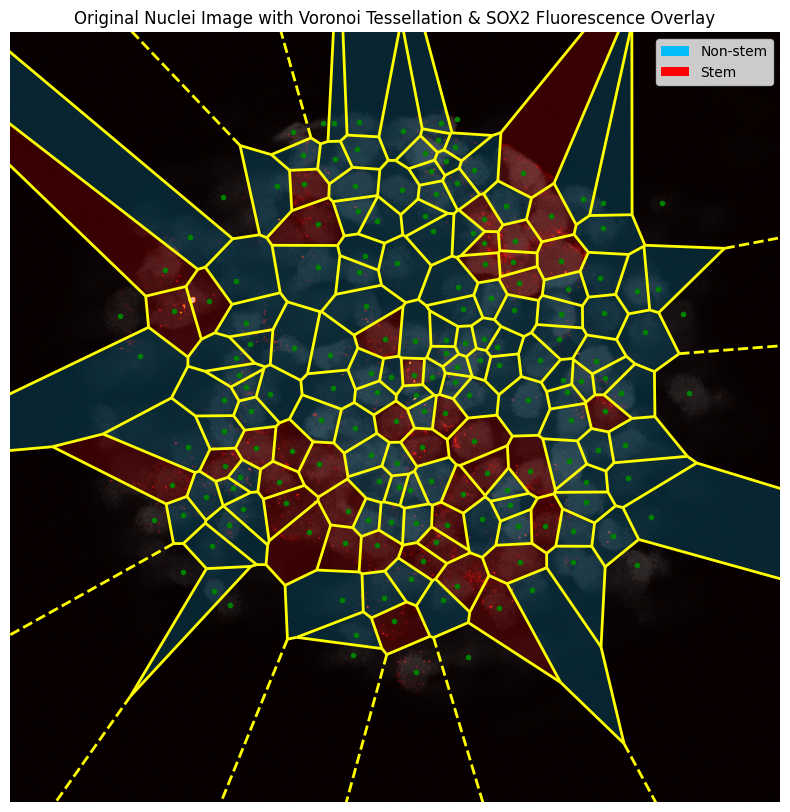

In [40]:
# ========== CLUSTERING EXCLUDING CELLS OUTSIDE THE SPHEROID ==========

# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Filter centroids for in_spheroid == True
filtered_centroids = df[df['in_spheroid']][['centroid-0', 'centroid-1']].values

# Using the filtered centroids as the points for Voronoi, ensuring (x, y) coordinates
points = np.array([(c, r) for r, c in filtered_centroids])  # Coordinate reversal
vor = Voronoi(points)

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# Fill the Voronoi regions with color based on 'filtered_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0:
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df[df['in_spheroid']].iloc[point_idx].name
        
        # Get the color based on 'filtered_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_GMM_stemness']
        color = pastel_cmap(stemness_value)

        voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Overlay the fluorescence channel using a colormap. Assume 'hdome[z_slice]' represents your fluorescence channel.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids within the spheroid
for (r, c) in filtered_centroids:
    ax.plot(c, r, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]
ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()


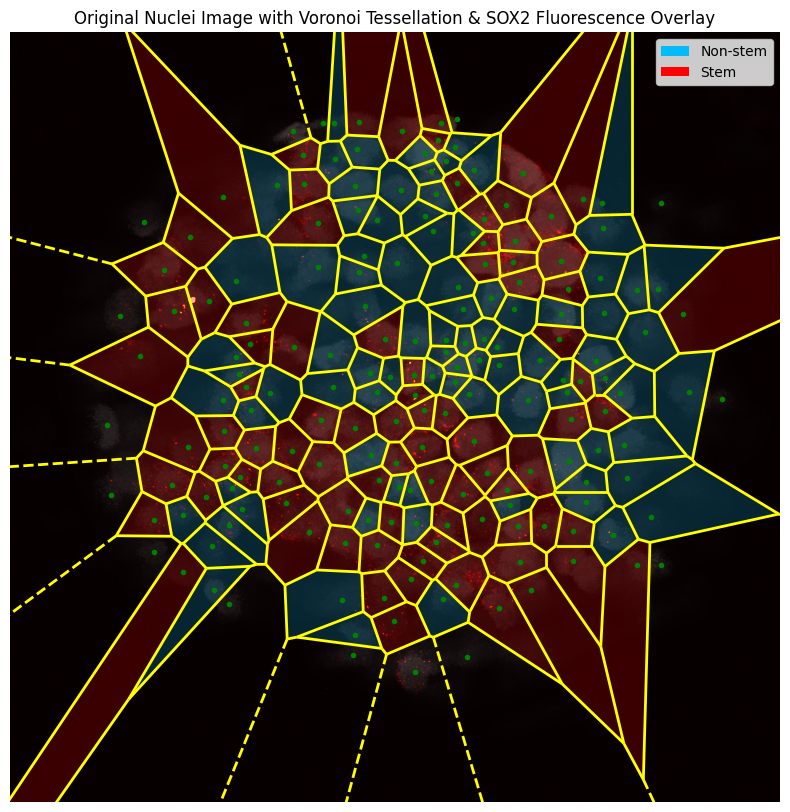

In [41]:
# ========== CUTTING DISTRIBUTION TAILS ==========

# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # modified colors as requested

# Using the centroids as the points for Voronoi, ensuring (x, y) coordinates
points = np.array([(c, r) for r, c in centroids])  # Coordinate reversal
vor = Voronoi(points)

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # Note the 4 for RGBA

# Fill the Voronoi regions with color based on 'filtered_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0:  # Check if the region is not infinite and not empty
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)

        # Get the color based on 'filtered_GMM_stemness'
        stemness_value = df.at[point_idx, 'tails_cut_GMM_stemness']
        color = pastel_cmap(stemness_value)

        voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Overlay the fluorescence channel using a colormap. Assume 'hdome[z_slice]' represents your fluorescence channel.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids on top
for (r, c) in centroids:
    ax.plot(c, r, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]
ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])  # Invert y-axis to match image coordinates
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

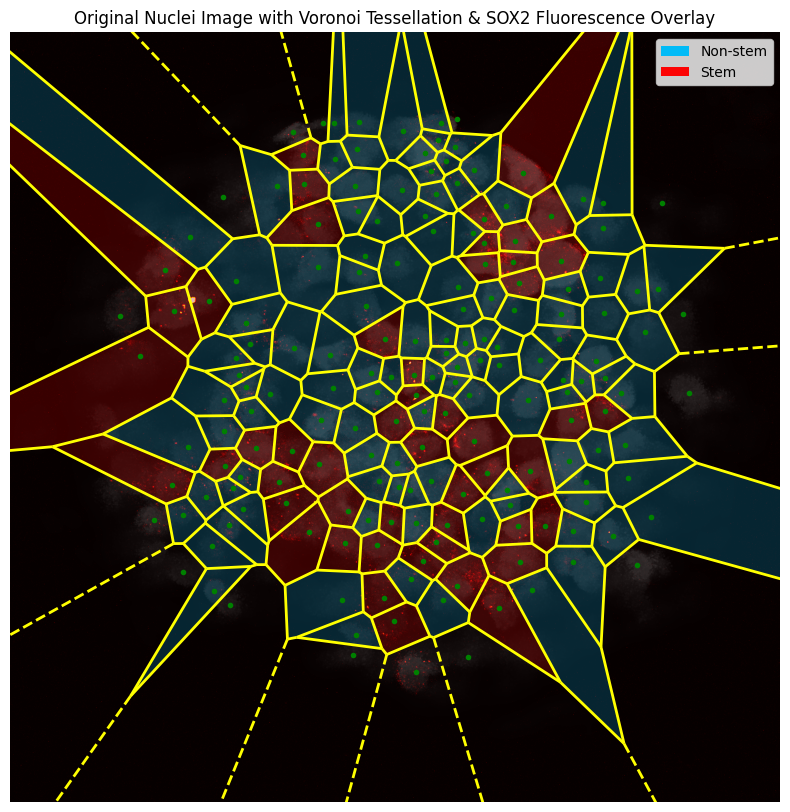

In [42]:
# ========== EXCLUDING CELLS OUTSIDE THE SPHEROID AND CUTTING DISTRIBUTION TAILS ==========

# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Filter centroids for in_spheroid == True
filtered_centroids = df[df['in_spheroid']][['centroid-0', 'centroid-1']].values

# Using the filtered centroids as the points for Voronoi, ensuring (x, y) coordinates
points = np.array([(c, r) for r, c in filtered_centroids])  # Coordinate reversal
vor = Voronoi(points)

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# Fill the Voronoi regions with color based on 'filtered_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0:
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df[df['in_spheroid']].iloc[point_idx].name
        
        # Get the color based on 'filtered_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_in_spheroid_GMM_stemness']
        color = pastel_cmap(stemness_value)

        voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Overlay the fluorescence channel using a colormap. Assume 'hdome[z_slice]' represents your fluorescence channel.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids within the spheroid
for (r, c) in filtered_centroids:
    ax.plot(c, r, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]
ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

I feel like the Voronoi plot should be done with every point and only colored for the ones inside the spheroid. If not, the plot becomes more ugly.

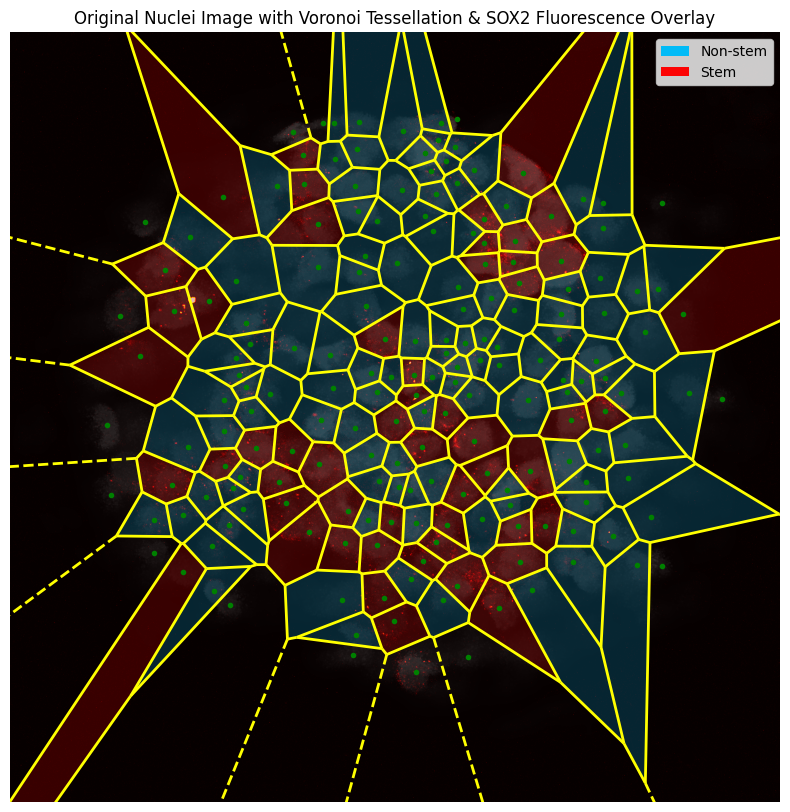

In [43]:

# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Convert centroids to (x, y) coordinates
centroids = df[['centroid-0', 'centroid-1']].values
points = np.array([(c, r) for r, c in centroids])

# Compute Voronoi with all points
vor = Voronoi(points)

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0:
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_in_spheroid_GMM_stemness']
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

# Overlay the fluorescence channel using a colormap. Assume 'hdome[z_slice]' represents your fluorescence channel.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(c, r, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]
ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()


The previous does not color regions outside the spheroid, but draws the complete Voronoi diagram. The following tries to color regions in the spheroid that are not colored because the extend to infinity.

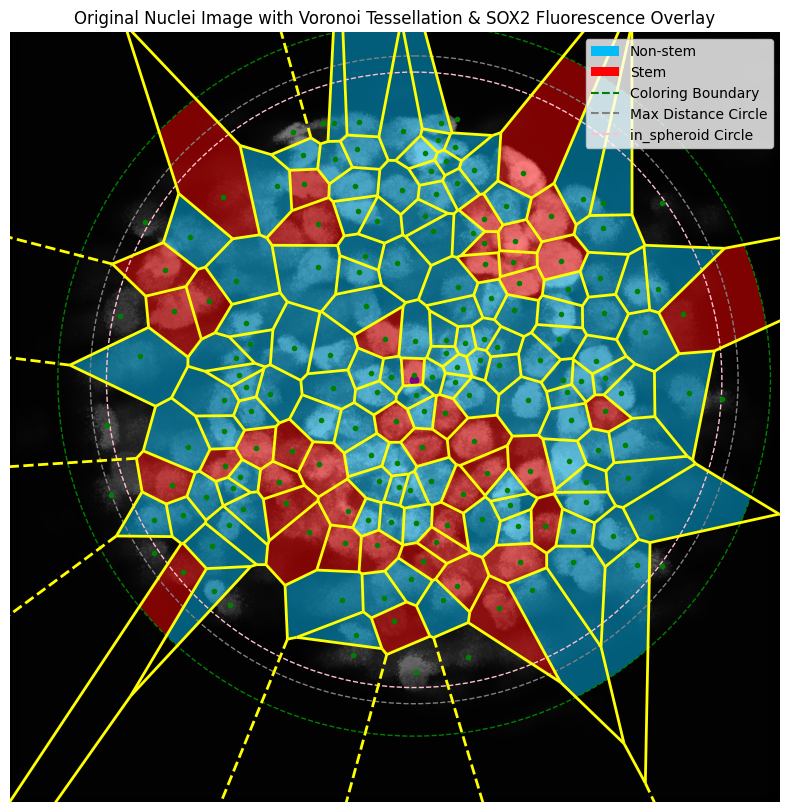

In [112]:
from shapely.geometry import Polygon, Point, MultiPolygon
from shapely.ops import unary_union

pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])

centroids = df[['centroid-0', 'centroid-1']].values
points = np.array([(c, r) for r, c in centroids])

vor = Voronoi(points)

image_shape = image_opened_bilateral.shape

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

voronoi_overlay = np.zeros(image_shape + (4,), dtype=np.uint8)

center_of_spheroid = df[['centroid-1', 'centroid-0']].mean().values
beta = 1.1 # 0.95
radius = beta * total_spheroid_diameter

resolution = 12640  # Increase this number for more detail
circular_boundary = Point(center_of_spheroid).buffer(radius, resolution=resolution)

# Coloring Circle
circle = Circle(center_of_spheroid[::1], radius, fill=False, color='green', linestyle='--', label='Coloring Boundary')
ax.add_patch(circle)

# Max distance circle
circle = Circle(center_of_spheroid[::1], total_spheroid_diameter, fill=False, color='gray', linestyle='--', label='Max Distance Circle')
ax.add_patch(circle)

# in_spheroid Circle
circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_diameter, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
ax.add_patch(circle)

# Center of spheroid
ax.plot(*center_of_spheroid[::1], color='purple', marker='o')

def process_polygon(polygon, color):
    if polygon.is_empty or not polygon.exterior:
        return
    x, y = polygon.exterior.xy
    rr, cc = skimage.draw.polygon(y, x, image_shape)
    voronoi_overlay[rr, cc] = np.array(color) * 255

simplify_tolerance = 0.01  # Adjust based on your requirements

for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if len(region) > 0 and -1 not in region:
        polygon_points = [vor.vertices[i] for i in region]
        polygon = Polygon(polygon_points)
    else:
        continue  # Skip if the region is unbounded or empty

    # Attempt to fix invalid polygons
    if not polygon.is_valid:
        polygon = polygon.buffer(0)

    try:
        clipped_polygon = polygon.intersection(circular_boundary)
        # Check and simplify the resulting polygon
        if isinstance(clipped_polygon, MultiPolygon):
            simplified_polygons = [poly.simplify(simplify_tolerance, preserve_topology=True) for poly in clipped_polygon]
            clipped_polygon = unary_union(simplified_polygons)
        elif isinstance(clipped_polygon, Polygon):
            clipped_polygon = clipped_polygon.simplify(simplify_tolerance, preserve_topology=True)
    except Exception as e:
        print(f"Error intersecting polygon: {e}")
        continue

    stemness_value = df.at[df.iloc[point_idx].name, 'filtered_GMM_stemness'] # tails_cut_in_spheroid_GMM_stemness
    if np.isnan(stemness_value) or not clipped_polygon.is_valid:
        continue
    color = pastel_cmap(stemness_value)
    
    process_polygon(clipped_polygon, color)

ax.imshow(voronoi_overlay, alpha=0.5)

voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

for (r, c) in centroids:
    ax.plot(c, r, 'g.')

# Let's include the legend for the circles
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem'),
                 Line2D([0], [0], color='green', linestyle='--', label='Coloring Boundary'),
                 Line2D([0], [0], color='gray', linestyle='--', label='Max Distance Circle'),
                 Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]
ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_shape[1]])
ax.set_ylim([image_shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()



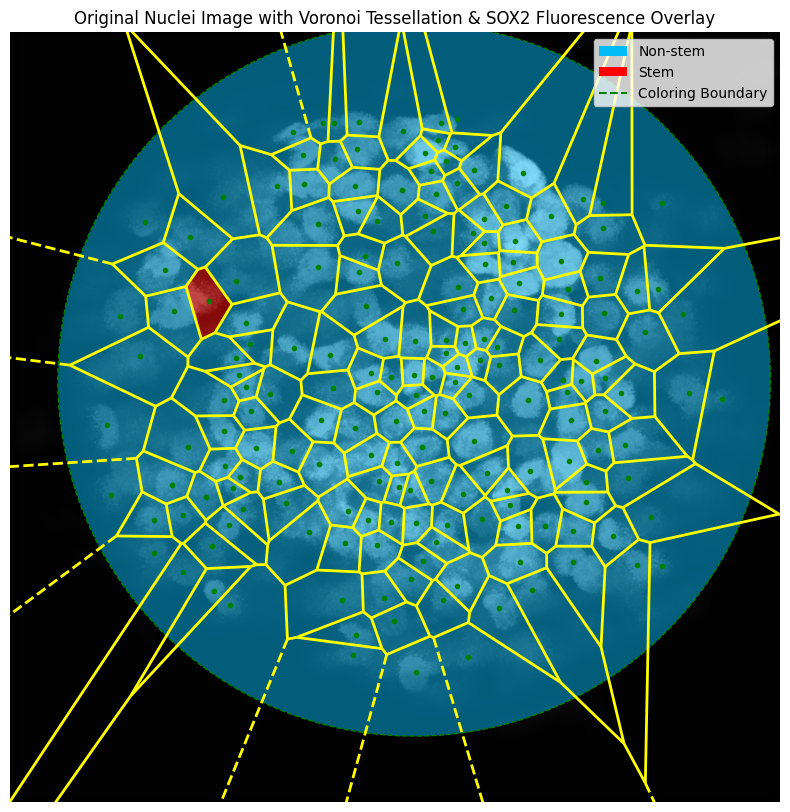

In [116]:

from shapely.geometry import Polygon, Point, MultiPolygon, LineString
from shapely.ops import unary_union, polygonize
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import Voronoi
import skimage.draw
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch, Circle
from matplotlib.lines import Line2D

pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])

centroids = df[['centroid-0', 'centroid-1']].values
points = np.array([(c, r) for r, c in centroids])

vor = Voronoi(points)

image_shape = image_opened_bilateral.shape

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

voronoi_overlay = np.zeros(image_shape + (4,), dtype=np.uint8)

center_of_spheroid = df[['centroid-1', 'centroid-0']].mean().values
beta = 1.1
radius = beta * total_spheroid_diameter

resolution = 1264
circular_boundary = Point(center_of_spheroid).buffer(radius, resolution=resolution)

# Correctly plotting circles without reversing the coordinate order
circle = Circle(center_of_spheroid, radius, fill=False, color='green', linestyle='--', label='Coloring Boundary')
ax.add_patch(circle)

def process_polygon(polygon, color):
    if polygon.is_empty or not polygon.exterior:
        return
    x, y = polygon.exterior.xy
    rr, cc = skimage.draw.polygon(y, x, image_shape)
    voronoi_overlay[rr, cc] = np.array(color) * 255

simplify_tolerance = 0.01

for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if len(region) > 0 and -1 not in region:
        polygon_points = [vor.vertices[i] for i in region]
        polygon = Polygon(polygon_points)
    else:
        # Handle unbounded regions by creating a large bounding box and intersecting it with the circular boundary
        bounds = circular_boundary.bounds
        large_polygon = Polygon([(bounds[0], bounds[1]), (bounds[2], bounds[1]), (bounds[2], bounds[3]), (bounds[0], bounds[3])])
        polygon = large_polygon

    if not polygon.is_valid:
        polygon = polygon.buffer(0)

    try:
        clipped_polygon = polygon.intersection(circular_boundary)
        if isinstance(clipped_polygon, MultiPolygon):
            simplified_polygons = [poly.simplify(simplify_tolerance, preserve_topology=True) for poly in clipped_polygon]
            clipped_polygon = unary_union(simplified_polygons)
        elif isinstance(clipped_polygon, Polygon):
            clipped_polygon = clipped_polygon.simplify(simplify_tolerance, preserve_topology=True)
    except Exception as e:
        print(f"Error intersecting polygon: {e}")
        continue

    stemness_value = df.at[df.iloc[point_idx].name, 'filtered_GMM_stemness']
    if not clipped_polygon.is_empty and not np.isnan(stemness_value) and clipped_polygon.is_valid:
        color = pastel_cmap(stemness_value)
        process_polygon(clipped_polygon, color)

ax.imshow(voronoi_overlay, alpha=0.5)

voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='yellow', line_width=2)

for (r, c) in centroids:
    ax.plot(c, r, 'g.')

legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem'),
                 Line2D([0], [0], color='green', linestyle='--', label='Coloring Boundary')]
ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_shape[1]])
ax.set_ylim([image_shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()


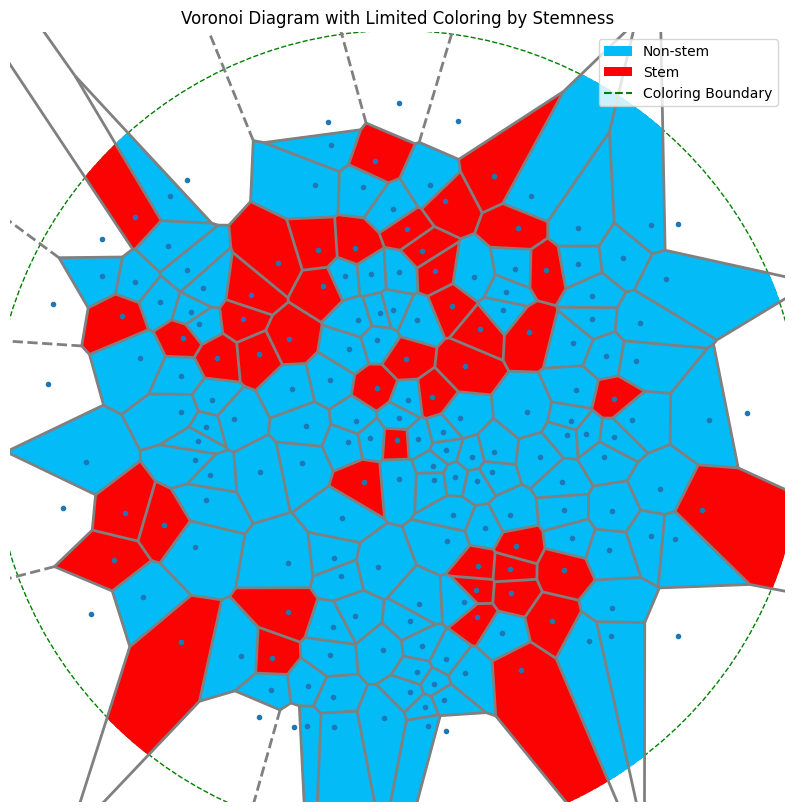

In [126]:
from shapely.geometry import Polygon, Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Polygon as mplPolygon, Circle
from matplotlib.collections import PatchCollection

pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])

# Create a color map based on 'filtered_GMM_stemness' values
stemness_colors = ['#02bbf7' if value == 0 else '#fc0303' for value in df['filtered_GMM_stemness']]

centroids = df[['centroid-0', 'centroid-1']].values
points = np.array([(c, r) for r, c in centroids])

vor = Voronoi(points)

fig, ax = plt.subplots(figsize=(10, 10))

center_of_spheroid = df[['centroid-1', 'centroid-0']].mean().values
beta = 1.1
radius = beta * total_spheroid_diameter

resolution = 12640
circular_boundary = Point(center_of_spheroid).buffer(radius, resolution=resolution)

circle = Circle(center_of_spheroid, radius, fill=False, color='green', linestyle='--', label='Coloring Boundary')
ax.add_patch(circle)

patches = []  # List to hold the polygons

for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if len(region) > 0 and -1 not in region:
        polygon_points = [vor.vertices[i] for i in region]
        polygon = Polygon(polygon_points)
    else:
        continue

    if not polygon.is_valid:
        polygon = polygon.buffer(0)

    try:
        clipped_polygon = polygon.intersection(circular_boundary)
        if not clipped_polygon.is_empty and isinstance(clipped_polygon, Polygon):
            # Correctly create a mplPolygon from the Shapely Polygon
            exterior_coords = list(clipped_polygon.exterior.coords)
            mpl_poly = mplPolygon(exterior_coords, closed=True, color=stemness_colors[point_idx])
            patches.append(mpl_poly)  # Add the mplPolygon to the list of patches
    except Exception as e:
        print(f"Error intersecting polygon: {e}")
        continue

# Create a PatchCollection from the list of polygons
p = PatchCollection(patches, match_original=True)
ax.add_collection(p)

voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='gray', line_width=2)
padding = 100
ax.set_xlim(vor.min_bound[0] - padding, vor.max_bound[0] + padding)
ax.set_ylim(vor.min_bound[1] - padding, vor.max_bound[1] + padding)
ax.set_aspect('equal', adjustable='datalim')
ax.set_title('Voronoi Diagram with Limited Coloring by Stemness')

legend_elements = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem'),
                 Line2D([0], [0], color='green', linestyle='--', label='Coloring Boundary')]
ax.legend(handles=legend_elements, loc='upper right')

plt.axis('off')
plt.show()


